# TeamDetector relabel flow

Notebook para inspeccionar visualmente el flujo `YOLO -> homografía -> TeamDetector` sobre `video_prueba_medio` y entender por qué ciertas detecciones salen de `player` hacia `referee` o `goalkeeper`.

In [1]:
from pathlib import Path

import pandas as pd
from IPython.display import display

from team_detector_relabel_flow_utils import (
    analyze_team_detector_video,
    build_distance_margin_plot,
    build_bootstrap_reference_figures,
    build_field_relabel_map,
    build_lab_scatter_3d,
    build_relabel_timeline,
    load_artifacts,
    show_frame_overlay,
)

PROJECT_ROOT = Path.cwd()
CONFIG_PATH = "../../config.yaml"
VIDEO_KEY = "ucl_30s"
MODEL_PATH = PROJECT_ROOT / "../../models/finetuning/yolov11m/weights/best.pt"
OUTPUT_DIR = PROJECT_ROOT / "../../output/analysis/team_detector_video_ucl_30s_best"
VIDEO_PATH = PROJECT_ROOT / "../../data/partidoPrueba/ucl_final_5-5.mp4"
MAX_FRAMES = 200  # usa 200 si quieres una pasada rápida
FRAME_STEP = 1
TEAM_COLORS = None  # déjalo en None para arrancar sin referencias iniciales

In [2]:
artifacts = analyze_team_detector_video(
    config_path=CONFIG_PATH,
    video_key=VIDEO_KEY,
    model_path=MODEL_PATH,
    output_dir=OUTPUT_DIR,
    max_frames=MAX_FRAMES,
    frame_step=FRAME_STEP,
    team_colors=TEAM_COLORS,
    verbose=True,
)
artifacts


0: 384x640 2 balls, 1 goalkeeper, 26 players, 2 referees, 72.2ms
Speed: 2.4ms preprocess, 72.2ms inference, 11.0ms postprocess per image at shape (1, 3, 384, 640)
Procesados 1 frames...

0: 384x640 3 balls, 26 players, 3 referees, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 balls, 26 players, 4 referees, 11.6ms
Speed: 2.2ms preprocess, 11.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 balls, 2 goalkeepers, 28 players, 2 referees, 8.1ms
Speed: 1.8ms preprocess, 8.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 balls, 2 goalkeepers, 23 players, 4 referees, 7.8ms
Speed: 1.7ms preprocess, 7.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 balls, 26 players, 4 referees, 7.9ms
Speed: 1.7ms preprocess, 7.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 players, 4 referees, 8.2ms
Spee

RelabelAnalysisArtifacts(output_dir=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_ucl_30s_best'), detections_csv=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_ucl_30s_best/detections.csv'), frames_jsonl=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_ucl_30s_best/frames.jsonl'), summary_json=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_ucl_30s_best/summary.json'))

In [3]:
detections_df, frames_df, summary = load_artifacts(OUTPUT_DIR)
display(pd.Series(summary))
display(detections_df.head())
display(frames_df.head())

video_path                  /home/hegarc04/narrador-futbol/data/partidoPru...
model_path                  /home/hegarc04/narrador-futbol/experiments/vis...
frames_processed                                                          200
detections_total                                                         5222
relabelled_total                                                          315
relabelled_to_referee                                                      99
relabelled_to_goalkeeper                                                  109
bootstrap_min_samples                           {'player': 60, 'referee': 15}
bootstrap_samples_used                          {'player': 75, 'referee': 18}
bootstrap_samples_json      /home/hegarc04/narrador-futbol/experiments/vis...
output_dir                  /home/hegarc04/narrador-futbol/experiments/vis...
dtype: object

,frame_idx,det_idx,bbox_x1,bbox_y1,bbox_x2,bbox_y2,bbox_w,bbox_h,confidence,class_yolo,...,ref_referee_b,upper_bound_Equipo 1,median_dist_Equipo 1,iqr_dist_Equipo 1,upper_bound_Equipo 2,median_dist_Equipo 2,iqr_dist_Equipo 2,upper_bound_referee,median_dist_referee,iqr_dist_referee
0,0,0,1144.715820,446.026428,1175.074341,501.899597,30.358521,55.873169,0.887611,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,1,1655.352539,558.452271,1684.140381,621.320068,28.787842,62.867798,0.878074,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,455.010773,677.053223,485.421204,745.313782,30.410431,68.260559,0.875435,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,552.499268,591.163818,586.425537,657.573669,33.926270,66.409851,0.869292,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,1071.416748,546.574524,1103.027710,607.151062,31.610962,60.576538,0.864208,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,frame_idx,num_detections,homography_quality_status,homography_quality_score,field_positions_usable_for_tracking,team_colors,outfield_team_distance_stats,referee_distance_stats,updated
0,0,30,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"
1,1,32,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"
2,2,32,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"
3,3,34,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"
4,4,32,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"


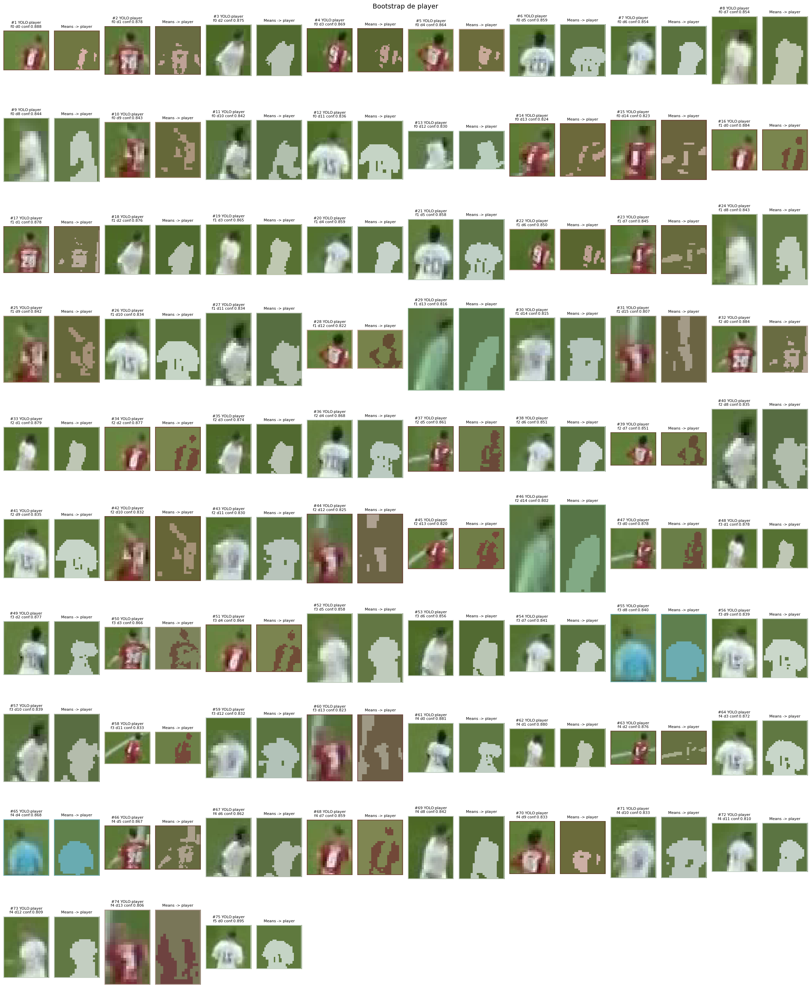

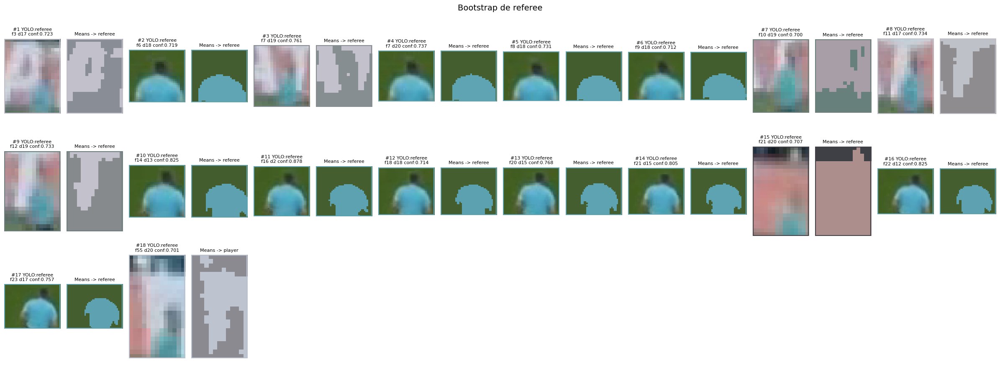

In [4]:
fig_bootstrap_player, fig_bootstrap_referee = build_bootstrap_reference_figures(OUTPUT_DIR, n_cols=8)


## Resumen rápido

- `distance_margin > 0`: la detección cae fuera del `upper_bound` del equipo más cercano.
- `new_possible_class`: decisión de `_check_possible_new_class`.
- `class_final`: salida final de `_reassign_class`.
- Los marcadores en rombo indican relabel.

In [5]:
summary_table = pd.DataFrame(
    {
        "detecciones": [len(detections_df)],
        "relabel_total": [int(detections_df['relabelled'].sum())],
        "player/ref -> referee": [int(detections_df['relabeled_to_referee'].sum())],
        "player/ref -> goalkeeper": [int(detections_df['relabeled_to_goalkeeper'].sum())],
        "frames": [int(detections_df['frame_idx'].nunique())],
    }
)
display(summary_table)

display(
    detections_df[
        [
            'class_yolo', 'class_final', 'new_possible_class', 'reason_path', 'team_final'
        ]
    ]
    .value_counts(dropna=False)
    .rename('count')
    .reset_index()
    .head(20)
)

,detecciones,relabel_total,player/ref -> referee,player/ref -> goalkeeper,frames
0,5222,315,99,109,200


,class_yolo,class_final,new_possible_class,reason_path,team_final,count
0,player,player,player,new_possible:player|reassign:player|reason:rel...,Equipo 2,2370
1,player,player,player,new_possible:player|reassign:player|reason:rel...,Equipo 1,1168
2,player,player,player,new_possible:player|reassign:player|reason:ref...,Equipo 2,297
3,ball,ball,NaN,non_candidate_class,NaN,192
4,player,player,NaN,kept_class|reason:referee_cluster_outlier_fall...,Equipo 2,157
5,player,player,NaN,kept_class|reason:keep_current_class,NaN,129
6,player,player,player,new_possible:player|reassign:player|reason:kee...,Equipo 1,104
7,goalkeeper,goalkeeper,NaN,kept_class|reason:goalkeeper_confirmed,NaN,86
8,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,Equipo 2,77
9,referee,referee,NaN,kept_class|reason:outfield_cluster_decision_wi...,Equipo 2,75


In [6]:
fig_lab = build_lab_scatter_3d(detections_df, only_relabelled=False, include_spheres=True)
fig_lab.show()

In [7]:
fig_lab_relabel = build_lab_scatter_3d(
    detections_df,
    only_relabelled=True,
    include_spheres=True,
    title='Solo detecciones relabeleadas en LAB',
)
fig_lab_relabel.show()

In [8]:
fig_field = build_field_relabel_map(detections_df)
fig_field.show()

In [9]:
fig_timeline = build_relabel_timeline(detections_df)
fig_timeline.show()

fig_margin = build_distance_margin_plot(detections_df)
fig_margin.show()

In [10]:
relabel_cases = detections_df[detections_df['relabelled']].copy()
interesting = relabel_cases[
    [
        'frame_idx', 'det_idx', 'class_yolo', 'class_final', 'new_possible_class', 'reason_path',
        'field_x_m', 'field_y_m',
        'distance_before_equipo_1', 'distance_before_equipo_2',
        'upper_bound_Equipo 1', 'upper_bound_Equipo 2',
        'can_be_ref', 'can_be_goalkeeper'
    ]
].sort_values(['frame_idx', 'det_idx'])
display(interesting.head(50))

,frame_idx,det_idx,class_yolo,class_final,new_possible_class,reason_path,field_x_m,field_y_m,distance_before_equipo_1,distance_before_equipo_2,upper_bound_Equipo 1,upper_bound_Equipo 2,can_be_ref,can_be_goalkeeper
466,15,3,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,54.224277,19.355103,19.487694,92.395584,14.247480,62.079778,False,True
536,17,14,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,54.335697,19.170990,42.673443,68.894516,14.247480,62.079778,False,True
728,23,24,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,5.505031,27.622919,31.671705,111.386742,12.564728,60.839597,False,True
907,30,15,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,54.658104,17.547710,22.637589,91.411858,13.779450,54.304803,False,True
935,31,15,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,54.701443,17.648994,26.287066,87.962044,13.779450,54.304803,False,True
967,32,20,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,5.326684,26.909813,32.396603,115.811432,13.779450,54.304803,False,True
1102,37,22,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,6.121660,28.165743,32.313530,112.674652,14.868949,57.916898,False,True
1151,39,20,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,6.050790,28.030245,31.880091,109.720375,14.868949,57.916898,False,True
1276,44,17,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,6.764606,28.612225,32.052528,118.661705,15.201748,55.157363,False,True
1298,45,11,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,55.196461,41.543648,64.987587,50.040623,15.872347,34.185357,False,True


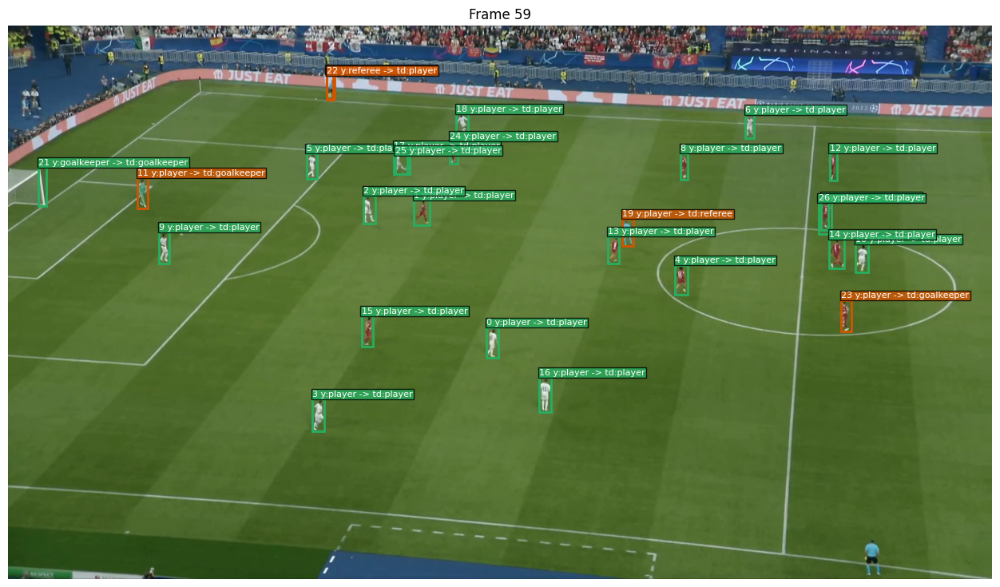

In [11]:
FRAME_TO_INSPECT = int(relabel_cases['frame_idx'].mode().iloc[0]) if not relabel_cases.empty else 0
fig = show_frame_overlay(detections_df, VIDEO_PATH, FRAME_TO_INSPECT)

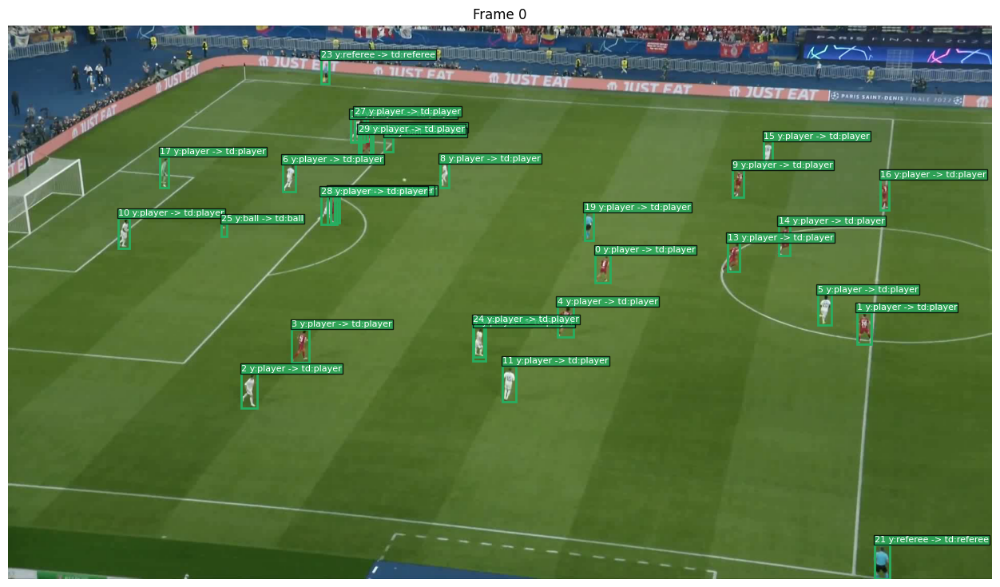

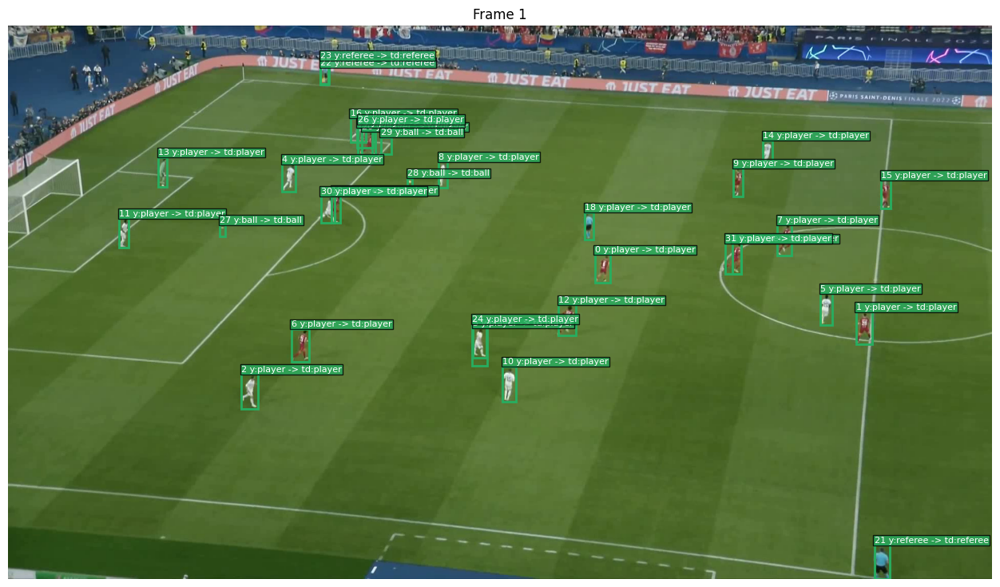

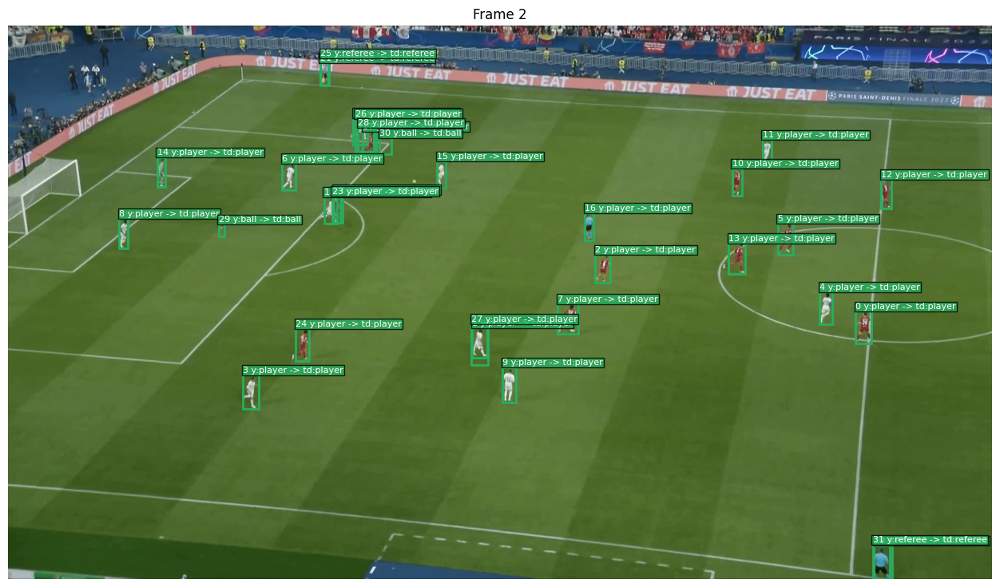

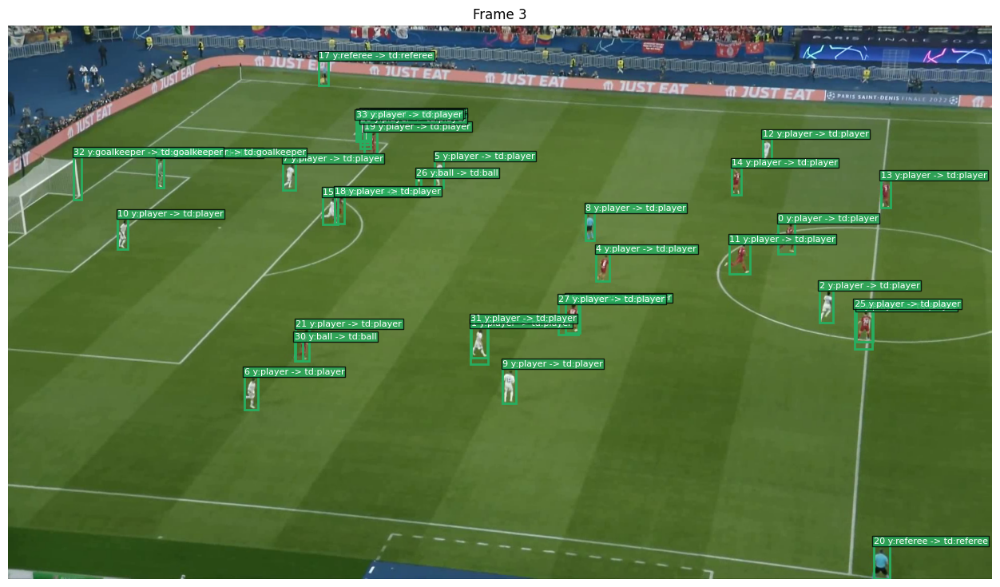

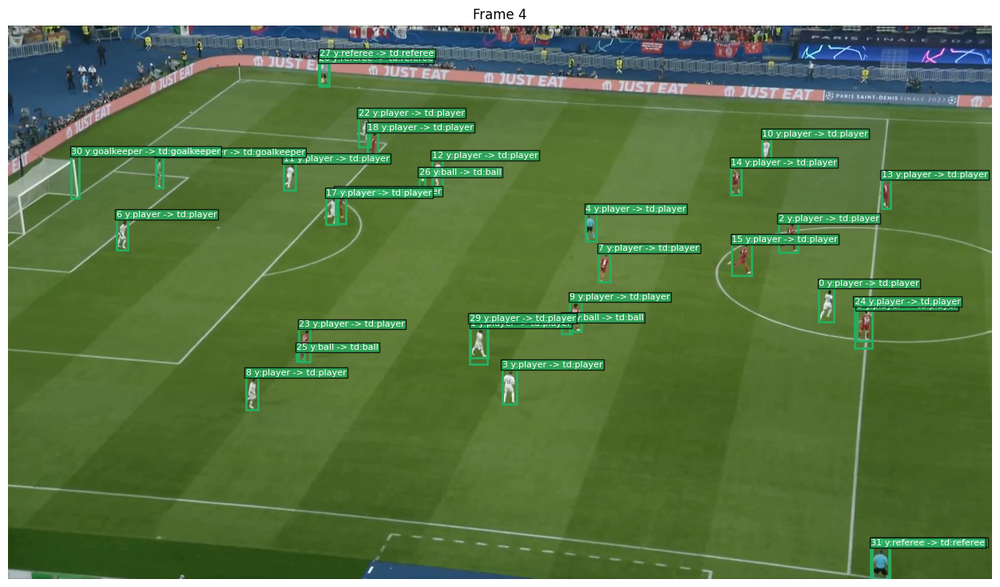

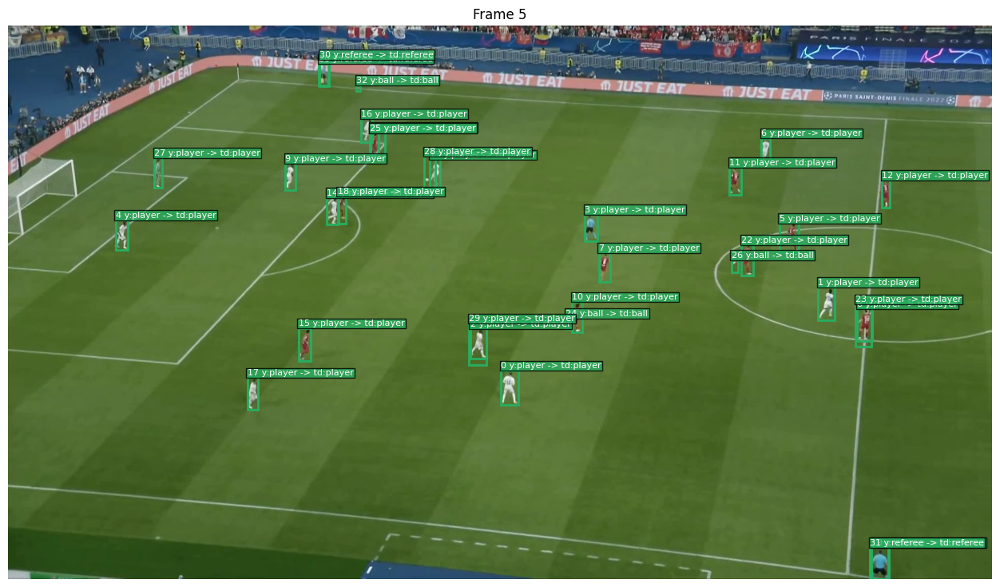

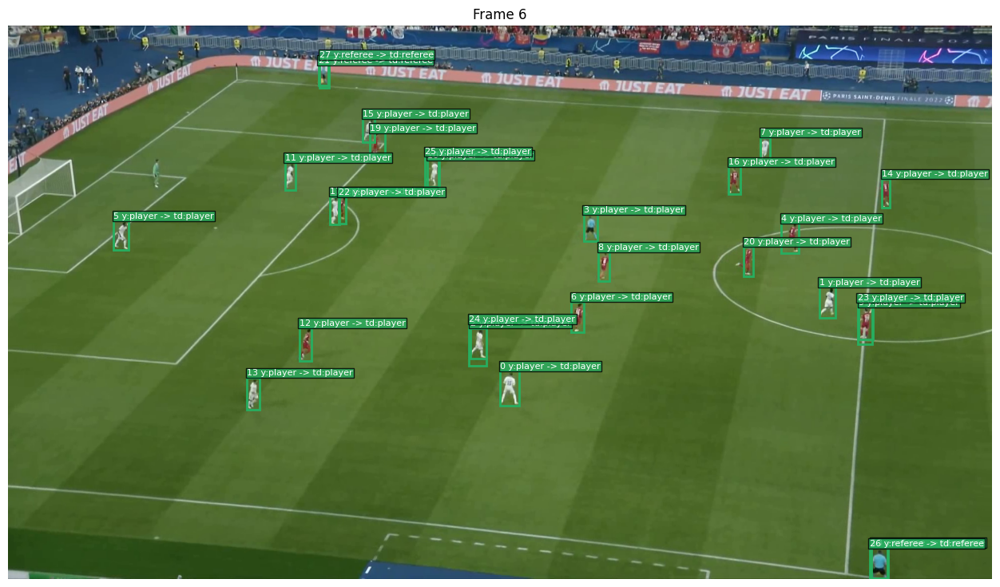

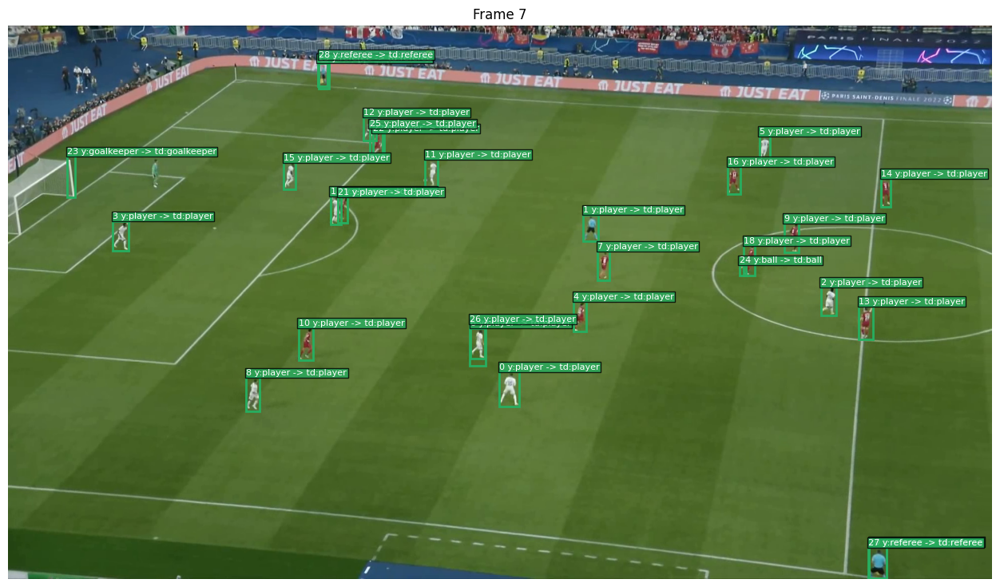

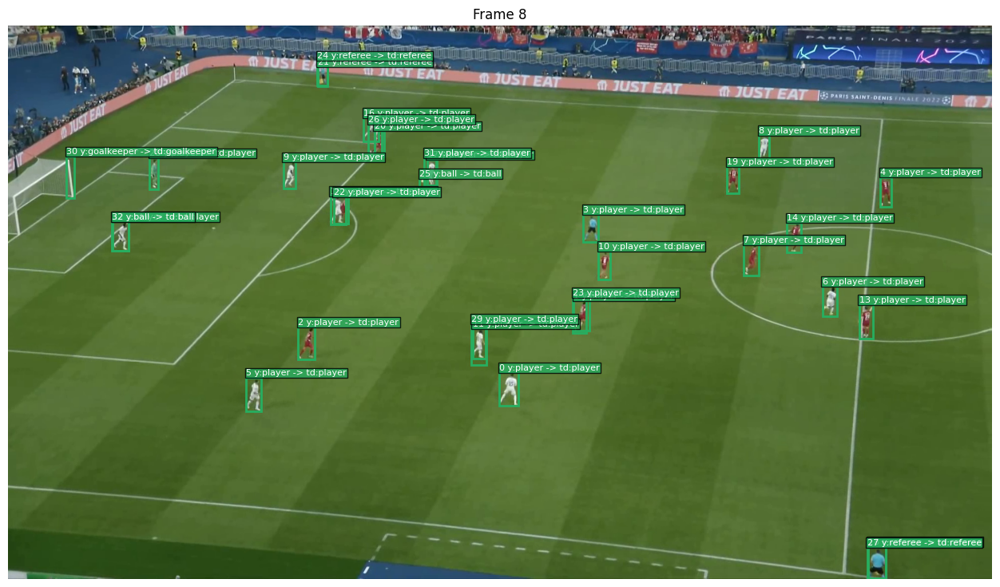

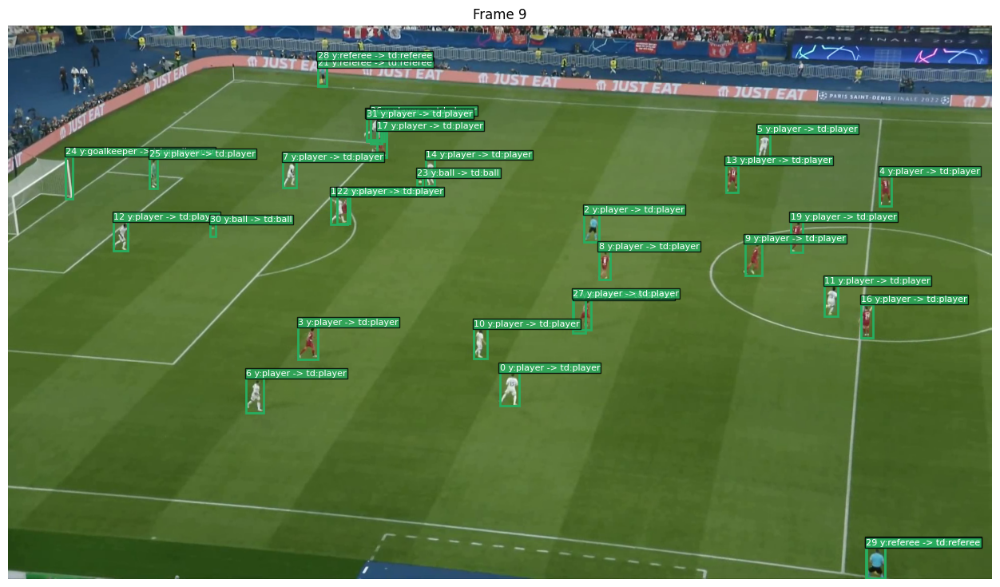

In [12]:
for i in range(0, 10):
    fig = show_frame_overlay(detections_df, VIDEO_PATH, i)